# AstroCLIP Embeddings Analysis

This notebook analyzes embeddings extracted from the **AstroCLIP model**.

AstroCLIP is a multimodal contrastive learning model trained on astronomical data. We analyze the joint embeddings to understand:
- The structure of the embedding space
- How embeddings correlate with physical galaxy properties
- The quality of the representation

**Embeddings location**: `/pbs/throng/training/astroinfo2025/data/AstroCLIP_team/AstroCLIP/AstroCLIP_joint_embedding_outliers/embeddings_all.pt`

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import torch
from astropy.io import fits
from astropy.table import Table
import umap
import time
from scipy.stats import spearmanr

# Configure matplotlib
plt.style.use('default')
sns.set_palette("husl")
%matplotlib inline

## 1. Load AstroCLIP Embeddings

Load the embeddings from the AstroCLIP model and inspect their structure.

In [2]:
# Path to AstroCLIP embeddings
embeddings_path = "/pbs/throng/training/astroinfo2025/data/AstroCLIP_team/AstroCLIP/AstroCLIP_joint_embedding_outliers/embeddings_all.pt"

print("Loading AstroCLIP embeddings...")
print(f"Path: {embeddings_path}")

# Load the embeddings
try:
    data = torch.load(embeddings_path, map_location="cpu")
    print(f"\n✓ Data loaded successfully")
    print(f"\nData type: {type(data)}")
    
    # Inspect the structure
    if isinstance(data, dict):
        print(f"\nDictionary keys: {list(data.keys())}")
        print("\nKey details:")
        for key, value in data.items():
            if isinstance(value, torch.Tensor):
                print(f"  {key}: Tensor{tuple(value.shape)} (dtype: {value.dtype})")
            elif isinstance(value, np.ndarray):
                print(f"  {key}: ndarray{value.shape} (dtype: {value.dtype})")
            elif isinstance(value, list):
                print(f"  {key}: list of length {len(value)}")
                if len(value) > 0:
                    print(f"    First element type: {type(value[0])}")
            else:
                print(f"  {key}: {type(value).__name__}")
    
    elif isinstance(data, list):
        print(f"\nList of length: {len(data)}")
        if len(data) > 0:
            print(f"First element type: {type(data[0])}")
            if isinstance(data[0], dict):
                print(f"First element keys: {list(data[0].keys())}")
    
    elif isinstance(data, torch.Tensor):
        print(f"\nTensor shape: {data.shape}")
        print(f"Tensor dtype: {data.dtype}")
    
    else:
        print(f"\nUnexpected data type: {type(data)}")
        print(f"Data: {data}")

except FileNotFoundError:
    print(f"\n❌ File not found: {embeddings_path}")
    print("Please verify the path is correct.")
    raise
except Exception as e:
    print(f"\n❌ Error loading file: {e}")
    raise

Loading AstroCLIP embeddings...
Path: /pbs/throng/training/astroinfo2025/data/AstroCLIP_team/AstroCLIP/AstroCLIP_joint_embedding_outliers/embeddings_all.pt

✓ Data loaded successfully

Data type: <class 'dict'>

Dictionary keys: ['cosine_similarity', 'image_embeddings', 'spectrum_embeddings', 'joint_pca', 'pca_variance', 'flux', 'wavelength', 'images', 'redshift', 'pair_id', 'targetid']

Key details:
  cosine_similarity: Tensor(12210,) (dtype: torch.float32)
  image_embeddings: Tensor(12210, 1024) (dtype: torch.float32)
  spectrum_embeddings: Tensor(12210, 1024) (dtype: torch.float32)
  joint_pca: Tensor(12210, 2) (dtype: torch.float32)
  pca_variance: Tensor(2,) (dtype: torch.float32)
  flux: Tensor(12210, 7700) (dtype: torch.float32)
  wavelength: Tensor(12210, 7700) (dtype: torch.float32)
  images: Tensor(12210, 3, 144, 144) (dtype: torch.float32)
  redshift: Tensor(12210,) (dtype: torch.float32)
  pair_id: Tensor(12210,) (dtype: torch.int64)
  targetid: Tensor(12210,) (dtype: torch

## 2. Extract Embeddings and Metadata

Extract the embedding vectors and any associated metadata (IDs, redshifts, etc.).

In [3]:
# Extract embeddings based on the data structure
print("Extracting embeddings and metadata...\n")

if isinstance(data, dict):
    # If it's a dictionary, try to identify embedding and metadata keys
    possible_embedding_keys = ['embeddings', 'embedding', 'features', 'vectors', 'joint_embeddings']
    possible_id_keys = ['ids', 'object_ids', 'target_ids', 'TARGETID', 'object_id', 'targetid']
    possible_redshift_keys = ['redshifts', 'z', 'Z', 'redshift']
    
    # Find embeddings
    embeddings = None
    embedding_key = None
    for key in possible_embedding_keys:
        if key in data:
            embeddings = data[key]
            embedding_key = key
            break
    
    if embeddings is None:
        # Try to find any tensor that looks like embeddings (2D with reasonable size)
        for key, value in data.items():
            if isinstance(value, (torch.Tensor, np.ndarray)) and len(value.shape) == 2:
                embeddings = value
                embedding_key = key
                print(f"⚠ Using '{key}' as embeddings (guessed from structure)")
                break
    
    if embeddings is not None:
        if isinstance(embeddings, torch.Tensor):
            embeddings = embeddings.detach().cpu().numpy()
        print(f"✓ Embeddings found (key: '{embedding_key}')")
        print(f"  Shape: {embeddings.shape}")
        print(f"  Dtype: {embeddings.dtype}")
    else:
        print("❌ Could not find embeddings in data")
        print("Available keys:", list(data.keys()))
    
    # Find IDs
    object_ids = None
    id_key = None
    for key in possible_id_keys:
        if key in data:
            object_ids = data[key]
            id_key = key
            break
    
    if object_ids is not None:
        if isinstance(object_ids, torch.Tensor):
            object_ids = object_ids.detach().cpu().numpy()
        print(f"\n✓ Object IDs found (key: '{id_key}')")
        print(f"  Length: {len(object_ids)}")
        print(f"  Sample IDs: {object_ids[:5]}")
    else:
        print("\n⚠ Object IDs not found in data")
    
    # Find redshifts
    redshifts = None
    redshift_key = None
    for key in possible_redshift_keys:
        if key in data:
            redshifts = data[key]
            redshift_key = key
            break
    
    if redshifts is not None:
        if isinstance(redshifts, torch.Tensor):
            redshifts = redshifts.detach().cpu().numpy()
        print(f"\n✓ Redshifts found (key: '{redshift_key}')")
        print(f"  Length: {len(redshifts)}")
        print(f"  Range: [{np.min(redshifts):.3f}, {np.max(redshifts):.3f}]")
    else:
        print("\n⚠ Redshifts not found in data (will extract from catalog)")

elif isinstance(data, torch.Tensor):
    # If it's just a tensor, assume it's the embeddings
    embeddings = data.detach().cpu().numpy()
    print(f"✓ Embeddings tensor")
    print(f"  Shape: {embeddings.shape}")
    object_ids = None
    redshifts = None
    print("\n⚠ No metadata found (IDs, redshifts will need to come from catalog)")

else:
    print("❌ Unexpected data structure")
    embeddings = None
    object_ids = None
    redshifts = None

print("\n" + "="*70)
print("EXTRACTION SUMMARY")
print("="*70)
if embeddings is not None:
    print(f"✓ Embeddings: {embeddings.shape}")
else:
    print("❌ Embeddings: Not found")
    
if object_ids is not None:
    print(f"✓ Object IDs: {len(object_ids)}")
else:
    print("⚠ Object IDs: Not found")
    
if redshifts is not None:
    print(f"✓ Redshifts: {len(redshifts)}")
else:
    print("⚠ Redshifts: Not found")
print("="*70)

Extracting embeddings and metadata...

⚠ Using 'image_embeddings' as embeddings (guessed from structure)
✓ Embeddings found (key: 'image_embeddings')
  Shape: (12210, 1024)
  Dtype: float32

✓ Object IDs found (key: 'targetid')
  Length: 12210
  Sample IDs: [39633461153106868 39633427976163683 39633441204997296 39633453834044063
 39633446330434428]

✓ Redshifts found (key: 'redshift')
  Length: 12210
  Range: [0.009, 1.797]

EXTRACTION SUMMARY
✓ Embeddings: (12210, 1024)
✓ Object IDs: 12210
✓ Redshifts: 12210


## 3. Load Catalog and Match Objects

Load the DESI-Euclid catalog and match the AstroCLIP embeddings to catalog entries.

In [4]:
# Path to the combined DESI-Euclid catalog
catalog_path = "/pbs/throng/training/astroinfo2025/data/astroPT_euclid_desi_dataset/desi_euclid_catalog.fits"

print("Loading catalog...")
with fits.open(catalog_path) as hdul:
    catalog = Table(hdul[1].data)

print(f"✓ Catalog loaded: {len(catalog)} entries")
print(f"✓ Available columns ({len(catalog.colnames)}):")
for i, col in enumerate(catalog.colnames[:20]):
    print(f"  {col}")
if len(catalog.colnames) > 20:
    print(f"  ... and {len(catalog.colnames) - 20} more")

Loading catalog...
✓ Catalog loaded: 15999 entries
✓ Available columns (309):
  object_id
  right_ascension
  declination
  segmentation_area
  flux_h_sersic
  flux_vis_sersic
  ellipticity
  kron_radius
  segmentation_map_id
  VIS_name
  flux_detection_total
  flux_vis_4fwhm_aper
  flux_vis_3fwhm_aper
  flux_vis_2fwhm_aper
  flux_vis_1fwhm_aper
  spurious_flag
  det_quality_flag
  mumax_minus_mag
  smooth_or_featured_smooth
  smooth_or_featured_featured_or_disk
  ... and 289 more


In [5]:
# Match embeddings to catalog
print("\nMatching embeddings with catalog...")
print(f"  Embeddings: {len(embeddings)} objects")
print(f"  Catalog: {len(catalog)} entries")

if object_ids is not None:
    # We have object IDs, try to match with catalog
    # First, determine which ID column to use
    
    # Check ID ranges to determine if these are TARGETID (DESI) or object_id (Euclid)
    sample_ids = object_ids[:10]
    id_magnitude = np.log10(np.abs(sample_ids[sample_ids > 0]).mean()) if np.any(sample_ids > 0) else 0
    
    print(f"\nSample embedding IDs: {sample_ids}")
    print(f"ID magnitude: ~10^{id_magnitude:.1f}")
    
    # Euclid object_ids are typically ~10^18, DESI TARGETIDs are ~10^15-10^17
    if id_magnitude > 17:
        id_column = 'object_id'
        print(f"\n→ These appear to be Euclid object_ids (using '{id_column}' column)")
    else:
        id_column = 'TARGETID'
        print(f"\n→ These appear to be DESI TARGETIDs (using '{id_column}' column)")
    
    if id_column in catalog.colnames:
        # Create mapping
        catalog_ids = np.array(catalog[id_column], dtype=np.int64)
        valid_mask = catalog_ids > 0
        id_to_idx = {np.int64(cid): idx for idx, cid in enumerate(catalog_ids[valid_mask])}
        
        print(f"✓ Catalog mapping created: {len(id_to_idx)} valid entries")
        
        # Match embeddings
        matched_indices = []
        unmatched_count = 0
        
        for obj_id in object_ids:
            obj_id = np.int64(obj_id)
            if obj_id in id_to_idx:
                matched_indices.append(id_to_idx[obj_id])
            else:
                matched_indices.append(-1)
                unmatched_count += 1
        
        matched_indices = np.array(matched_indices)
        n_matched = (matched_indices >= 0).sum()
        match_rate = n_matched / len(object_ids) * 100
        
        print(f"\n{'='*60}")
        print(f"MATCHING RESULTS")
        print(f"{'='*60}")
        print(f"✓ Matched: {n_matched}/{len(object_ids)} ({match_rate:.1f}%)")
        
        if unmatched_count > 0:
            print(f"⚠ Unmatched: {unmatched_count} ({100-match_rate:.1f}%)")
        else:
            print(f"✓ Perfect match! All embeddings found in catalog.")
        
        print(f"{'='*60}")
    else:
        print(f"\n❌ Column '{id_column}' not found in catalog")
        print(f"Available ID columns: {[col for col in catalog.colnames if 'id' in col.lower() or 'target' in col.lower()]}")
        matched_indices = None

else:
    print("\n⚠ No object IDs available - cannot match to catalog")
    print("   Will need to determine matching strategy based on embedding structure")
    matched_indices = None


Matching embeddings with catalog...
  Embeddings: 12210 objects
  Catalog: 15999 entries

Sample embedding IDs: [39633461153106868 39633427976163683 39633441204997296 39633453834044063
 39633446330434428 39633425254059191 39633456329655027 39633443767714221
 39633461157298601 39633453855019269]
ID magnitude: ~10^16.6

→ These appear to be DESI TARGETIDs (using 'TARGETID' column)
✓ Catalog mapping created: 15263 valid entries

MATCHING RESULTS
✓ Matched: 12210/12210 (100.0%)
✓ Perfect match! All embeddings found in catalog.


## 4. Extract Physical Properties from Catalog

In [6]:
# Extract physical properties from catalog
def safe_extract(column_name):
    """Extract column values, filling unmatched entries with NaN"""
    if column_name not in catalog.colnames:
        print(f"⚠ Column '{column_name}' not found in catalog")
        return np.full(len(matched_indices), np.nan, dtype=float)
    
    values = np.full(len(matched_indices), np.nan, dtype=float)
    mask = matched_indices >= 0
    values[mask] = catalog[column_name][matched_indices[mask]]
    return values

def safe_extract_string(column_name):
    """Extract string column values, filling unmatched entries with empty string"""
    if column_name not in catalog.colnames:
        print(f"⚠ Column '{column_name}' not found in catalog")
        return np.full(len(matched_indices), '', dtype=object)
    
    values = np.full(len(matched_indices), '', dtype=object)
    mask = matched_indices >= 0
    values[mask] = [s.strip() if isinstance(s, (str, bytes)) else str(s) for s in catalog[column_name][matched_indices[mask]]]
    return values

print("Extracting physical properties from catalog...\n")

# Key physical properties
if redshifts is None:
    # If redshifts weren't in the embeddings, get them from catalog
    redshifts = safe_extract('Z')
    if np.all(np.isnan(redshifts)):
        redshifts = safe_extract('REDSHIFT')

logm = safe_extract('LOGM')              # Stellar mass
logsfr = safe_extract('LOGSFR')          # Star formation rate
dn4000 = safe_extract('DN4000')          # 4000Å break
gr_color = safe_extract('GR')            # g-r color
spectype = safe_extract_string('SPECTYPE')  # Spectral type

# Derived properties
ssfr = logsfr - logm  # Specific SFR

# Image/morphological properties from Euclid
ellipticity = safe_extract('ellipticity')                        # Ellipticity
kron_radius = safe_extract('kron_radius')                        # Kron radius (size)
concentration = safe_extract('concentration')                     # Concentration index
asymmetry = safe_extract('asymmetry')                            # Asymmetry
smoothness = safe_extract('smoothness')                          # Smoothness/clumpiness
gini = safe_extract('gini')                                      # Gini coefficient
sersic_index = safe_extract('sersic_sersic_vis_index')          # Sérsic index
sersic_radius = safe_extract('sersic_sersic_vis_radius')        # Sérsic radius
axis_ratio = safe_extract('sersic_sersic_vis_axis_ratio')       # Axis ratio

# Additional morphological features
has_spiral_arms = safe_extract('has_spiral_arms_yes')           # Spiral arms presence
disk_edge_on = safe_extract('disk_edge_on_yes')                 # Edge-on disk
det_quality_flag = safe_extract('det_quality_flag')             # Detection quality flag

# Emission line properties
halpha_flux = safe_extract('HALPHA_FLUX')
hbeta_flux = safe_extract('HBETA_FLUX')
# Compute Hα/Hβ ratio (Balmer decrement)
# Valid ratio should be > 2.86 (intrinsic), lower indicates dust attenuation
halpha_hbeta_ratio = np.full(len(halpha_flux), np.nan)
valid_mask = (hbeta_flux > 0) & (halpha_flux > 0)
halpha_hbeta_ratio[valid_mask] = halpha_flux[valid_mask] / hbeta_flux[valid_mask]

# Signal-to-Noise Ratios
snr_b = safe_extract('SNR_B')                                   # SNR in B band
snr_r = safe_extract('SNR_R')                                   # SNR in R band
snr_z = safe_extract('SNR_Z')                                   # SNR in Z band

# Print statistics
print("✓ Spectral/Physical property statistics:")
spectral_properties = {
    'Redshift': redshifts,
    'LOGM (stellar mass)': logm,
    'LOGSFR': logsfr,
    'sSFR (log)': ssfr,
    'DN4000': dn4000,
    'g-r color': gr_color
}

for name, values in spectral_properties.items():
    valid = ~np.isnan(values)
    if valid.sum() > 0:
        print(f"  {name}: {np.nanmean(values):.2f} ± {np.nanstd(values):.2f} (n={valid.sum()})")
    else:
        print(f"  {name}: No valid data")

print("\n✓ Morphological property statistics:")
morphological_properties = {
    'Ellipticity': ellipticity,
    'Kron radius': kron_radius,
    'Concentration': concentration,
    'Asymmetry': asymmetry,
    'Smoothness': smoothness,
    'Gini': gini,
    'Sérsic index': sersic_index,
    'Sérsic radius': sersic_radius,
    'Axis ratio': axis_ratio,
    'Has spiral arms': has_spiral_arms,
    'Disk edge-on': disk_edge_on,
    'Detection quality': det_quality_flag
}

for name, values in morphological_properties.items():
    valid = ~np.isnan(values)
    if valid.sum() > 0:
        print(f"  {name}: {np.nanmean(values):.2f} ± {np.nanstd(values):.2f} (n={valid.sum()})")
    else:
        print(f"  {name}: No valid data")

print("\n✓ Emission line property statistics:")
emission_properties = {
    'Hα/Hβ ratio': halpha_hbeta_ratio,
}

for name, values in emission_properties.items():
    valid = ~np.isnan(values)
    if valid.sum() > 0:
        print(f"  {name}: {np.nanmean(values):.2f} ± {np.nanstd(values):.2f} (n={valid.sum()})")
    else:
        print(f"  {name}: No valid data")

print("\n✓ Signal-to-Noise Ratio statistics:")
snr_properties = {
    'SNR B-band': snr_b,
    'SNR R-band': snr_r,
    'SNR Z-band': snr_z,
}

for name, values in snr_properties.items():
    valid = ~np.isnan(values)
    if valid.sum() > 0:
        print(f"  {name}: {np.nanmean(values):.2f} ± {np.nanstd(values):.2f} (n={valid.sum()})")
    else:
        print(f"  {name}: No valid data")

# Spectral types
unique_spectypes = np.unique(spectype[spectype != ''])
if len(unique_spectypes) > 0:
    print(f"\n✓ Spectral types found: {list(unique_spectypes)}")
    for stype in unique_spectypes:
        count = (spectype == stype).sum()
        print(f"  {stype}: {count:,} ({100*count/len(spectype):.1f}%)")

Extracting physical properties from catalog...

✓ Spectral/Physical property statistics:
  Redshift: 0.37 ± 0.24 (n=12210)
  LOGM (stellar mass): 9.70 ± 2.60 (n=12108)
  LOGSFR: -2.02 ± 4.39 (n=12108)
  sSFR (log): -11.71 ± 5.63 (n=12108)
  DN4000: 1.54 ± 0.48 (n=12210)
  g-r color: 0.50 ± 0.19 (n=12108)

✓ Morphological property statistics:
  Ellipticity: 0.34 ± 0.19 (n=12210)
  Kron radius: 88.36 ± 52.64 (n=12210)
  Concentration: 3.48 ± 0.69 (n=12210)
  Asymmetry: 0.29 ± 0.15 (n=12210)
  Smoothness: 0.22 ± 0.08 (n=12210)
  Gini: 0.66 ± 0.09 (n=12210)
  Sérsic index: 2.30 ± 1.65 (n=12210)
  Sérsic radius: 1.68 ± 2.67 (n=12210)
  Axis ratio: 0.64 ± 0.21 (n=12210)
  Has spiral arms: 43.25 ± 34.90 (n=10812)
  Disk edge-on: 14.29 ± 23.85 (n=10812)
  Detection quality: 23.47 ± 99.70 (n=12210)

✓ Emission line property statistics:
  Hα/Hβ ratio: 818360.88 ± 44014992.72 (n=7798)

✓ Signal-to-Noise Ratio statistics:
  SNR B-band: 0.97 ± 0.94 (n=12210)
  SNR R-band: 3.01 ± 2.00 (n=12210)
  SN

## 5. UMAP Dimensionality Reduction

Apply UMAP to reduce the embeddings to 2D for visualization.

In [7]:
print("Running UMAP dimensionality reduction...")
print("This may take a few minutes...")

# Configure UMAP
umap_model = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=2,
    metric='cosine',
    random_state=42
)

# Fit and transform
start_time = time.time()
embeddings_umap = umap_model.fit_transform(embeddings)
elapsed = time.time() - start_time

print(f"✓ UMAP completed in {elapsed:.2f} seconds")
print(f"UMAP embeddings shape: {embeddings_umap.shape}")

Running UMAP dimensionality reduction...
This may take a few minutes...


/pbs/throng/training/astroinfo2025/env/astroPT/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


✓ UMAP completed in 17.16 seconds
UMAP embeddings shape: (12210, 2)


## 6. Visualize UMAP - Redshift

Plot the 2D UMAP projection colored by redshift.

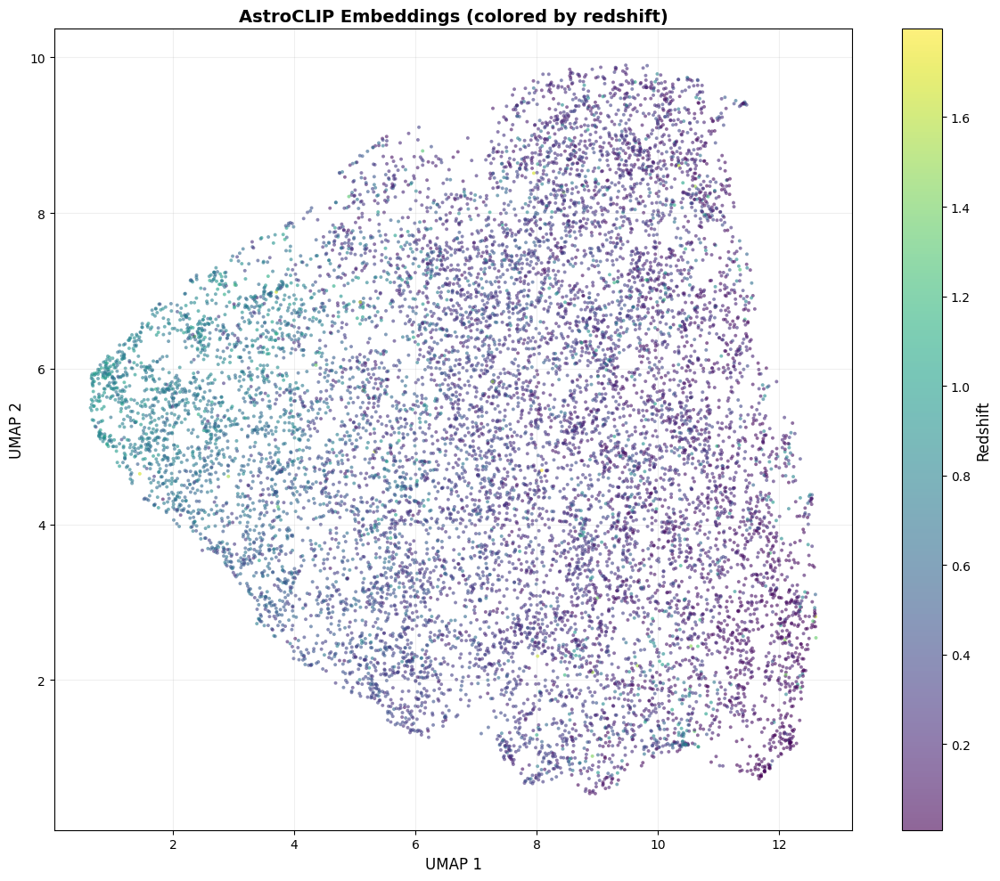

Saved: astroclip_embeddings_redshift.png


In [8]:
fig, ax = plt.subplots(figsize=(12, 10))

valid_z = ~np.isnan(redshifts)

if valid_z.sum() > 0:
    # Plot valid redshifts
    scatter = ax.scatter(
        embeddings_umap[valid_z, 0],
        embeddings_umap[valid_z, 1],
        c=redshifts[valid_z],
        cmap='viridis',
        s=8,
        alpha=0.6,
        edgecolors='none'
    )
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Redshift', fontsize=12)
    
    # Plot invalid redshifts in gray
    if (~valid_z).sum() > 0:
        ax.scatter(
            embeddings_umap[~valid_z, 0],
            embeddings_umap[~valid_z, 1],
            s=5,
            color='lightgray',
            alpha=0.3,
            edgecolors='none'
        )
else:
    ax.scatter(embeddings_umap[:, 0], embeddings_umap[:, 1], s=8, alpha=0.6)

ax.set_xlabel('UMAP 1', fontsize=12)
ax.set_ylabel('UMAP 2', fontsize=12)
ax.set_title('AstroCLIP Embeddings (colored by redshift)', fontsize=14, fontweight='bold')
ax.grid(alpha=0.2)

plt.tight_layout()
plt.savefig('astroclip_embeddings_redshift.png', dpi=300, bbox_inches='tight')
plt.show()

print("Saved: astroclip_embeddings_redshift.png")

## 7. Visualize by Physical Properties

Create visualizations colored by different physical properties.


SPECTRAL/PHYSICAL PROPERTIES VISUALIZATIONS



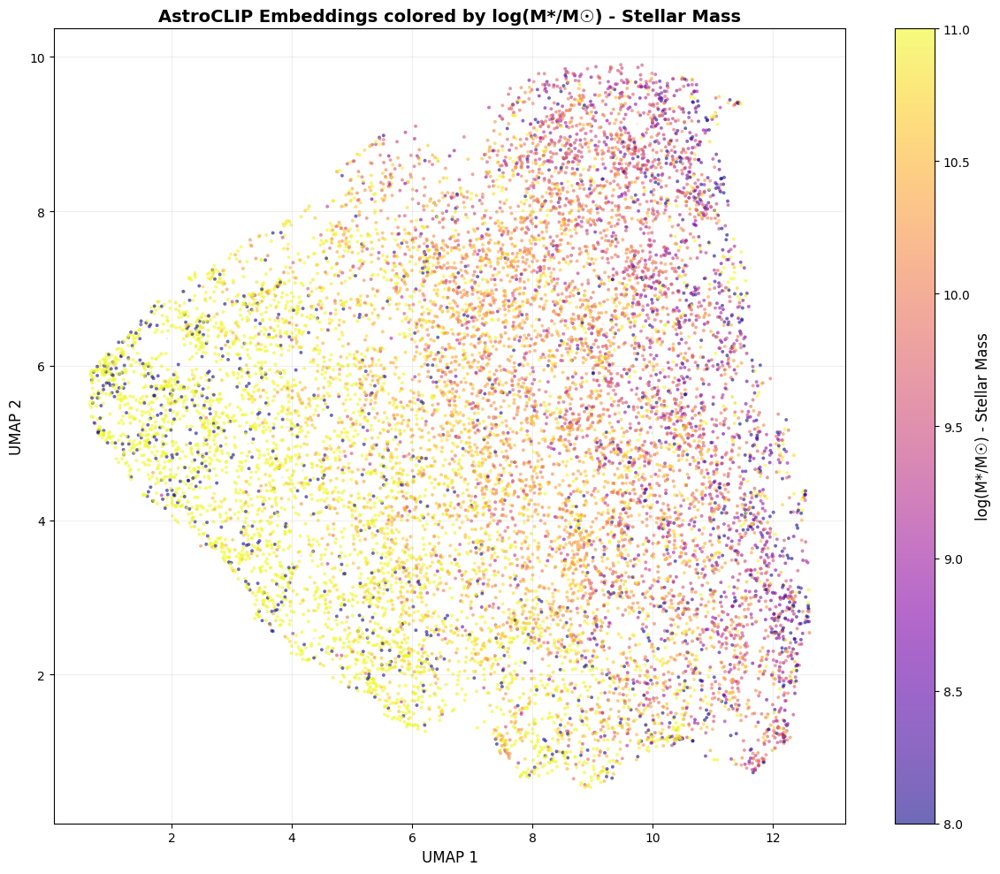

Saved: astroclip_embeddings_logm.png


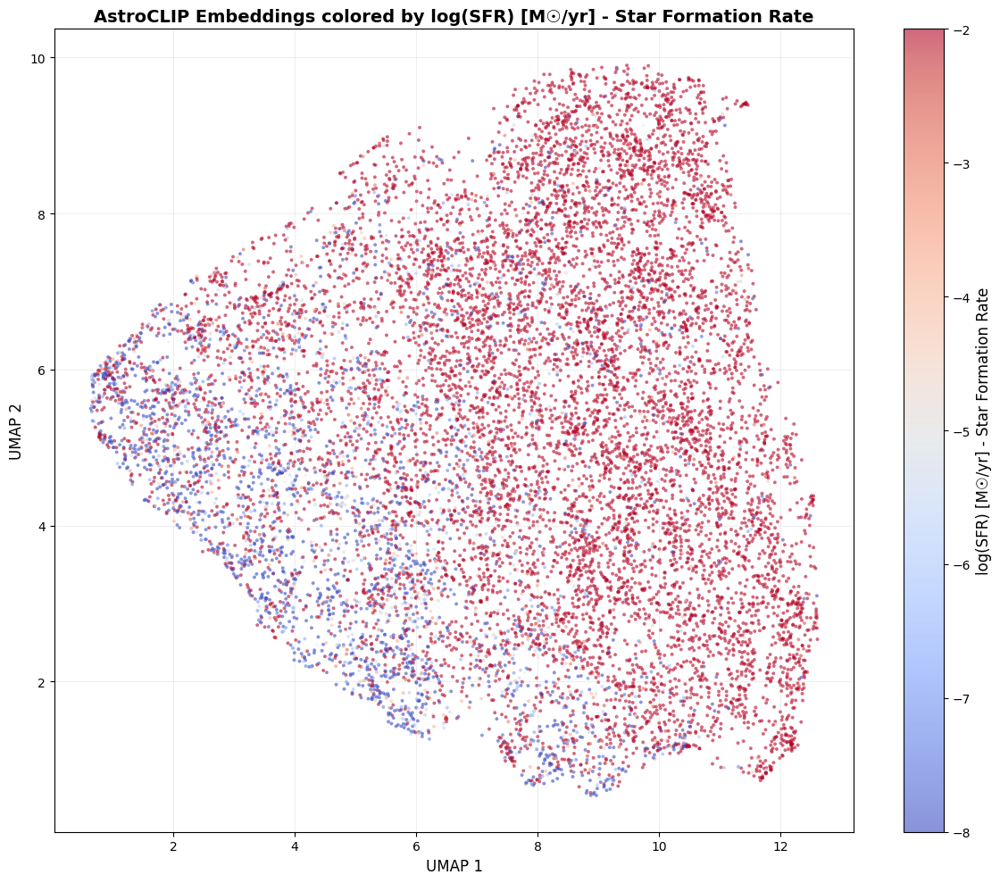

Saved: astroclip_embeddings_logsfr.png


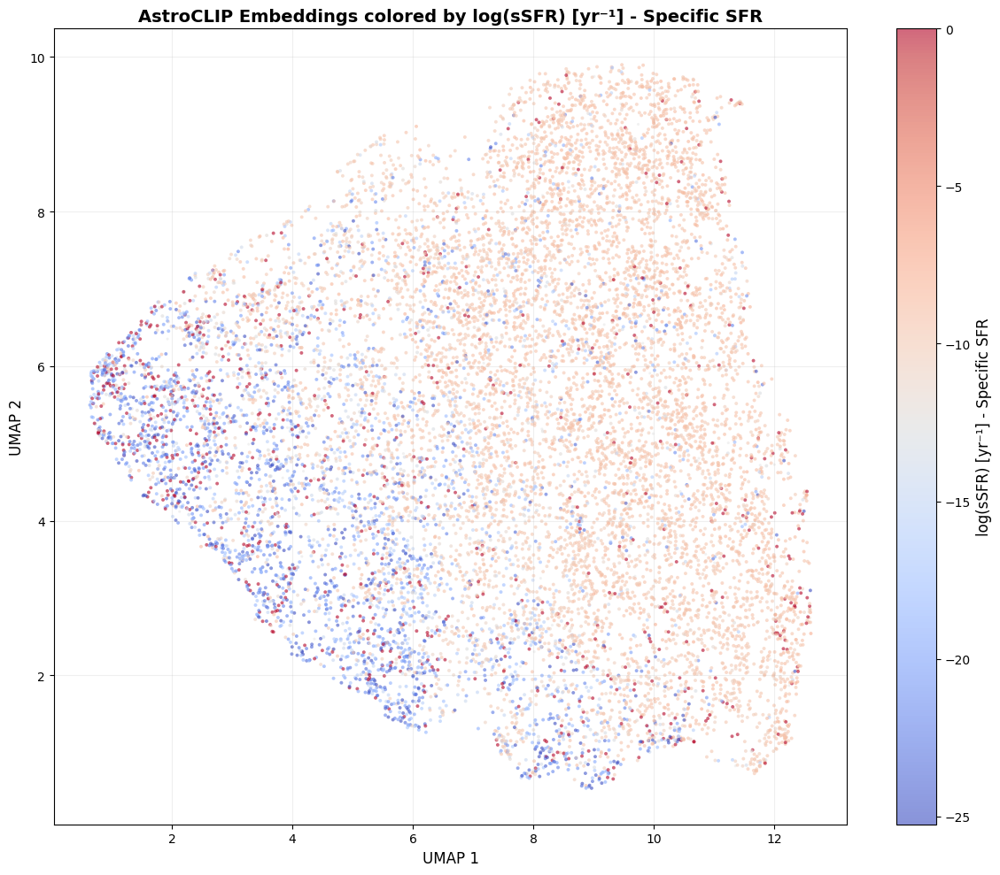

Saved: astroclip_embeddings_ssfr.png


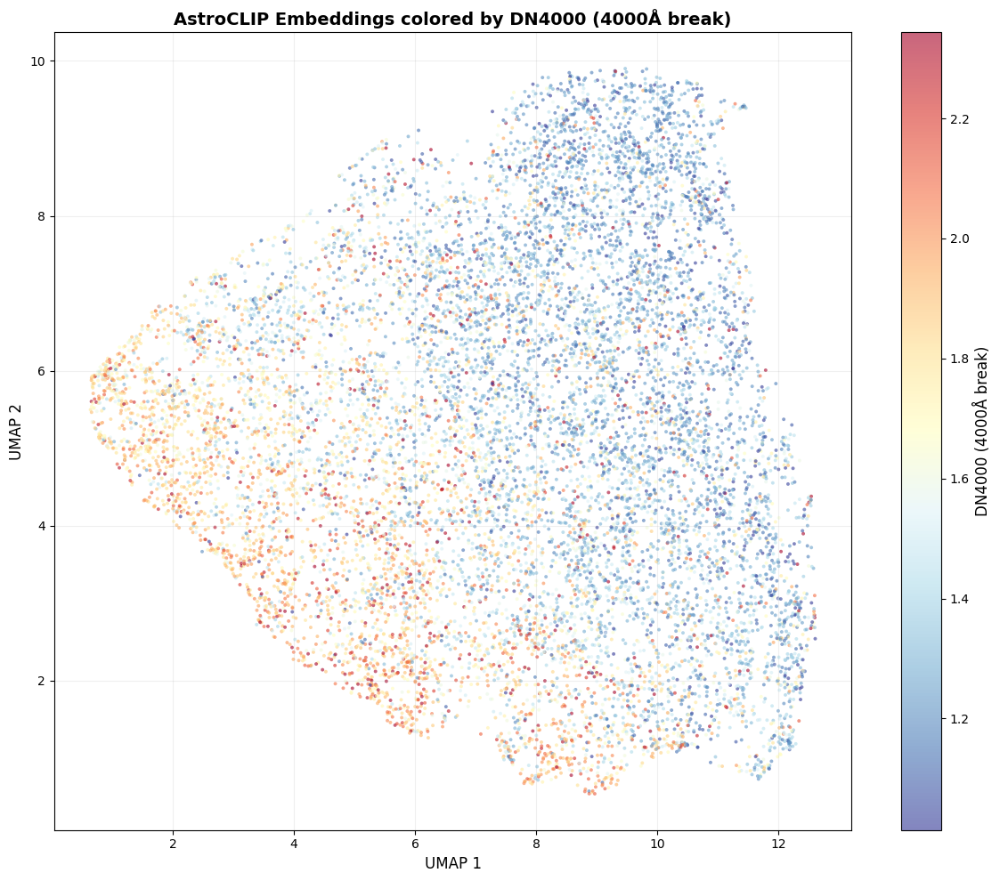

Saved: astroclip_embeddings_dn4000.png


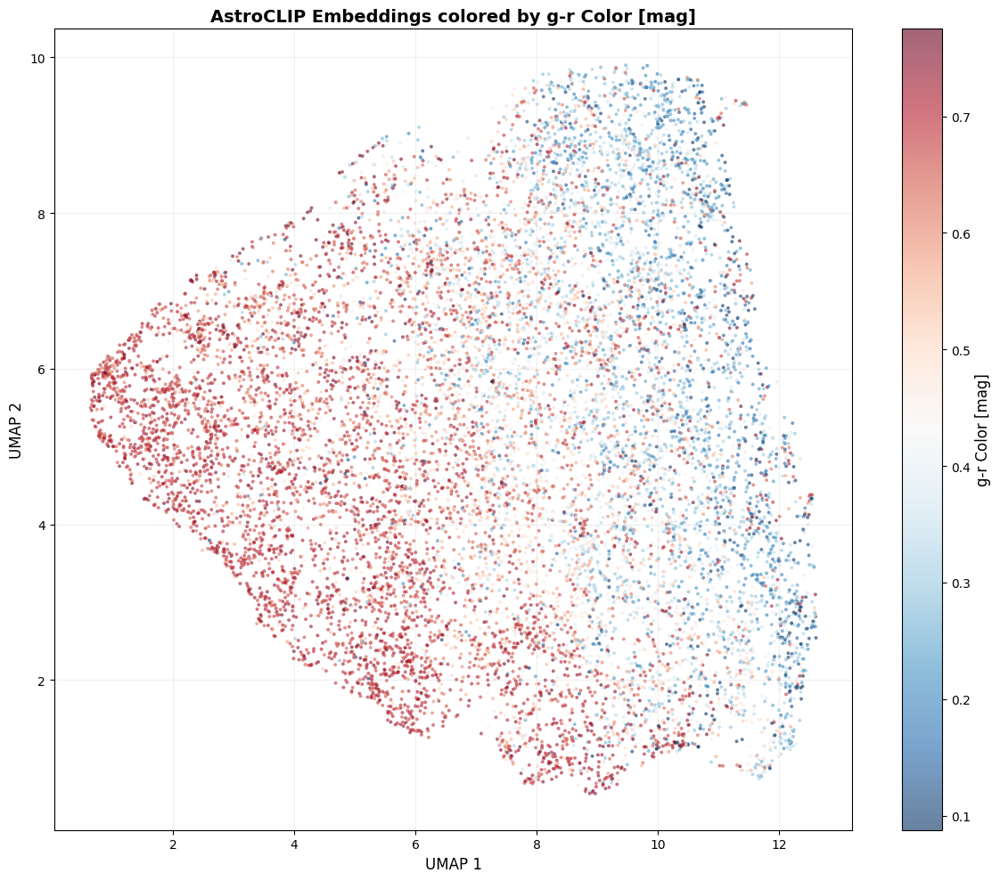

Saved: astroclip_embeddings_gr_color.png


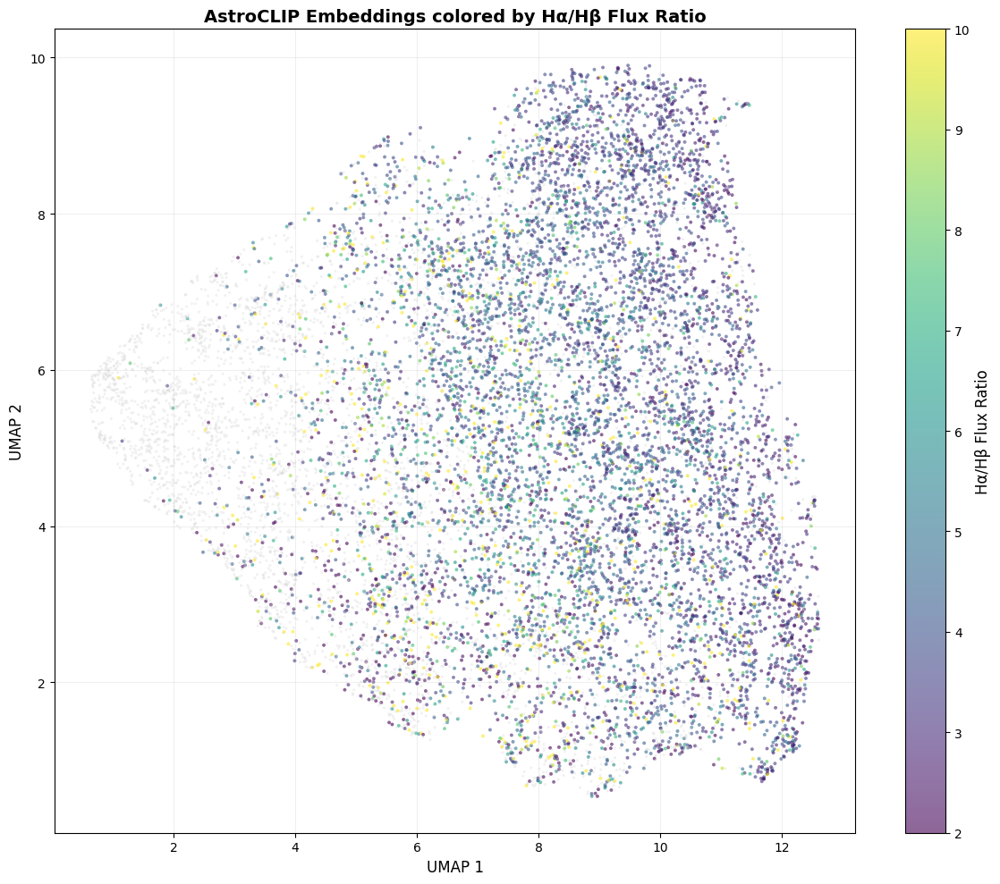

Saved: astroclip_embeddings_halpha_hbeta_ratio.png


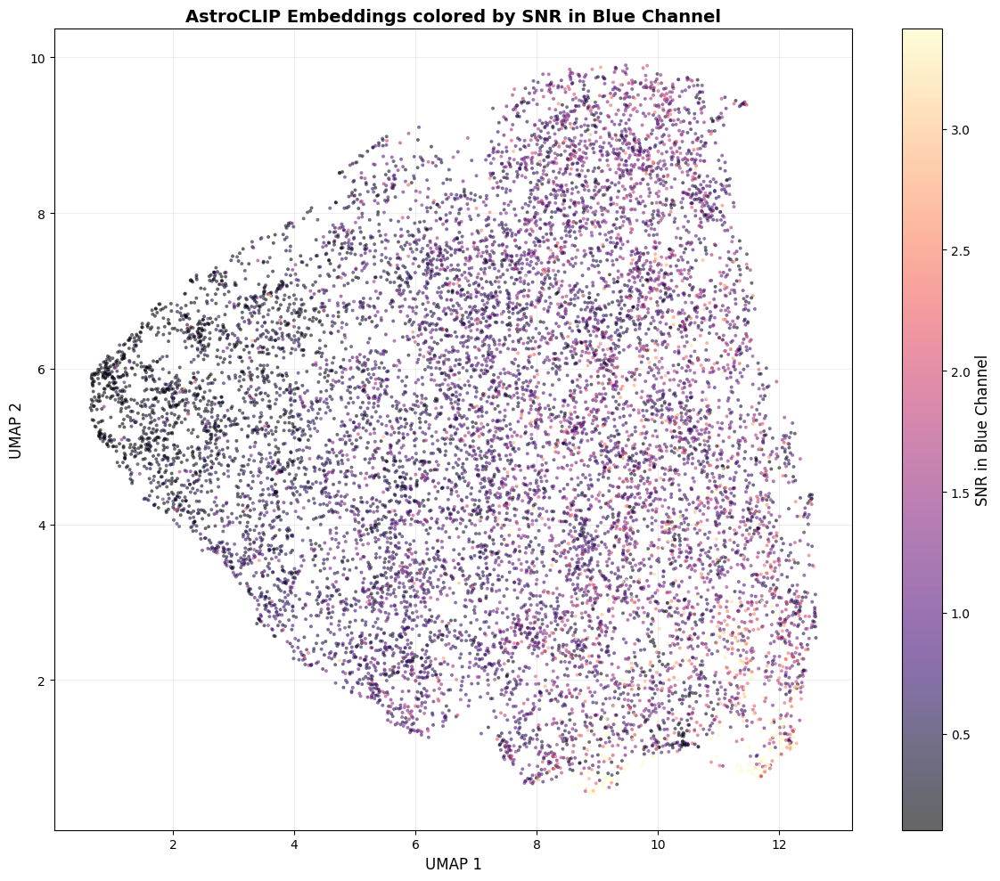

Saved: astroclip_embeddings_snr_b.png


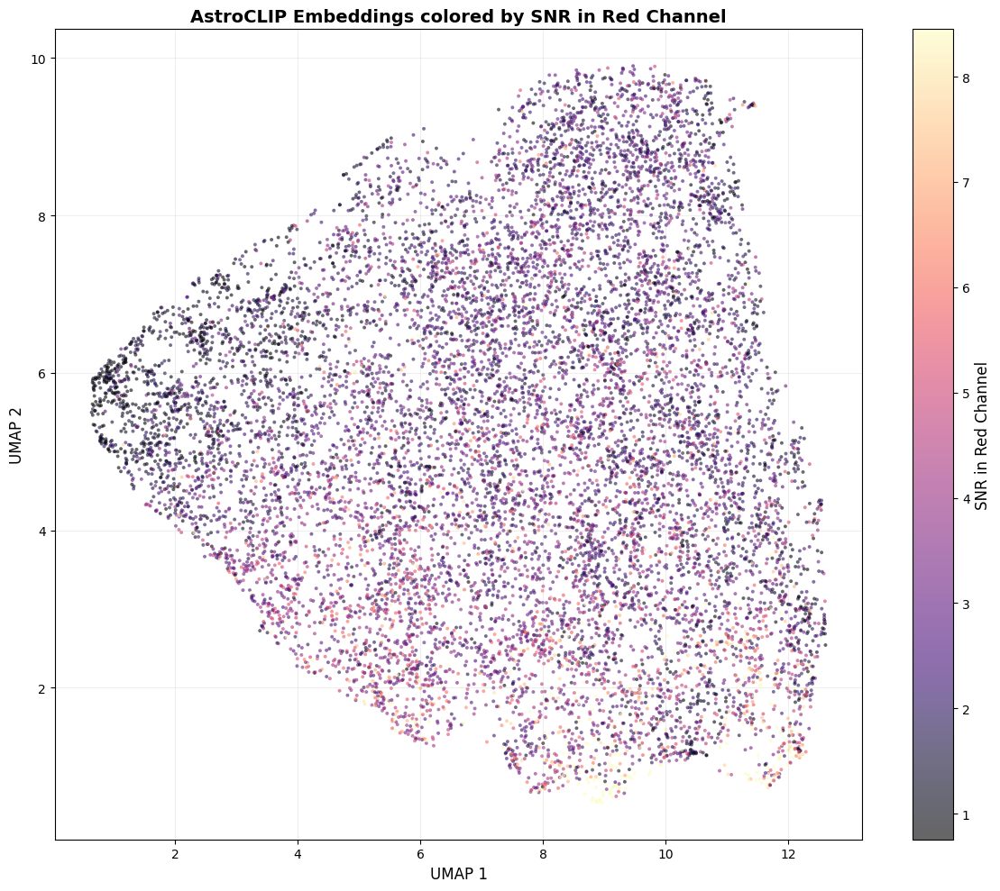

Saved: astroclip_embeddings_snr_r.png


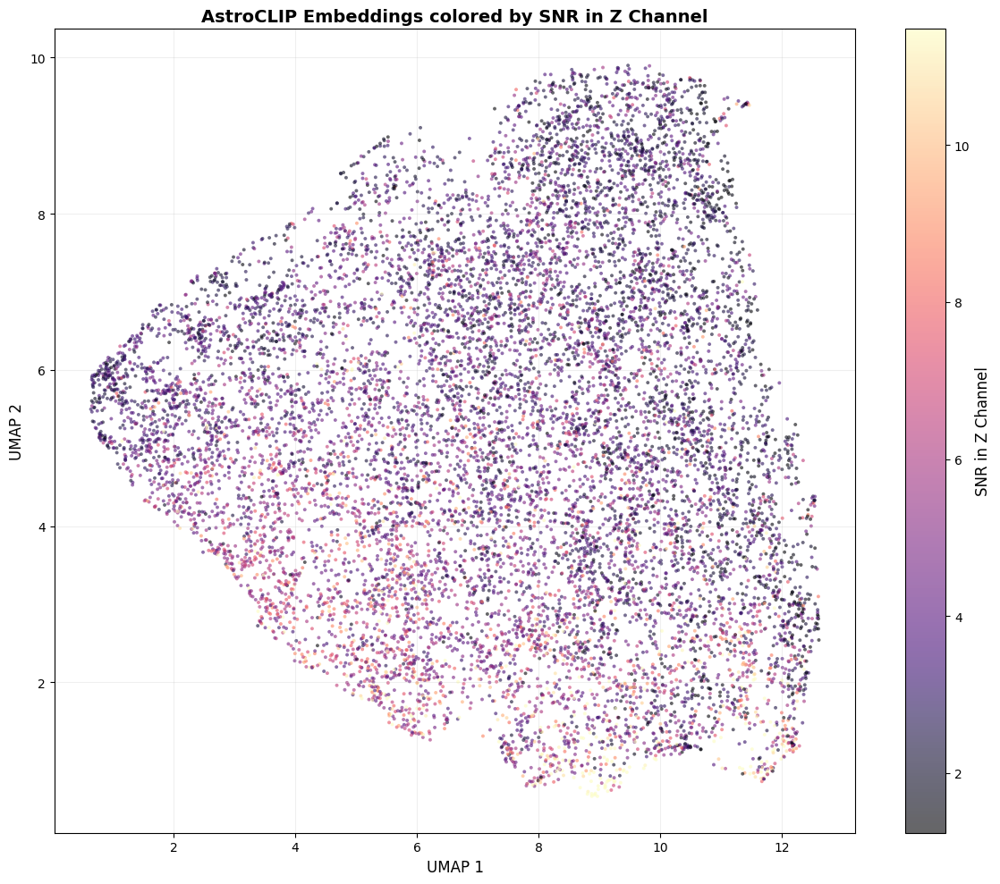

Saved: astroclip_embeddings_snr_z.png

MORPHOLOGICAL PROPERTIES VISUALIZATIONS



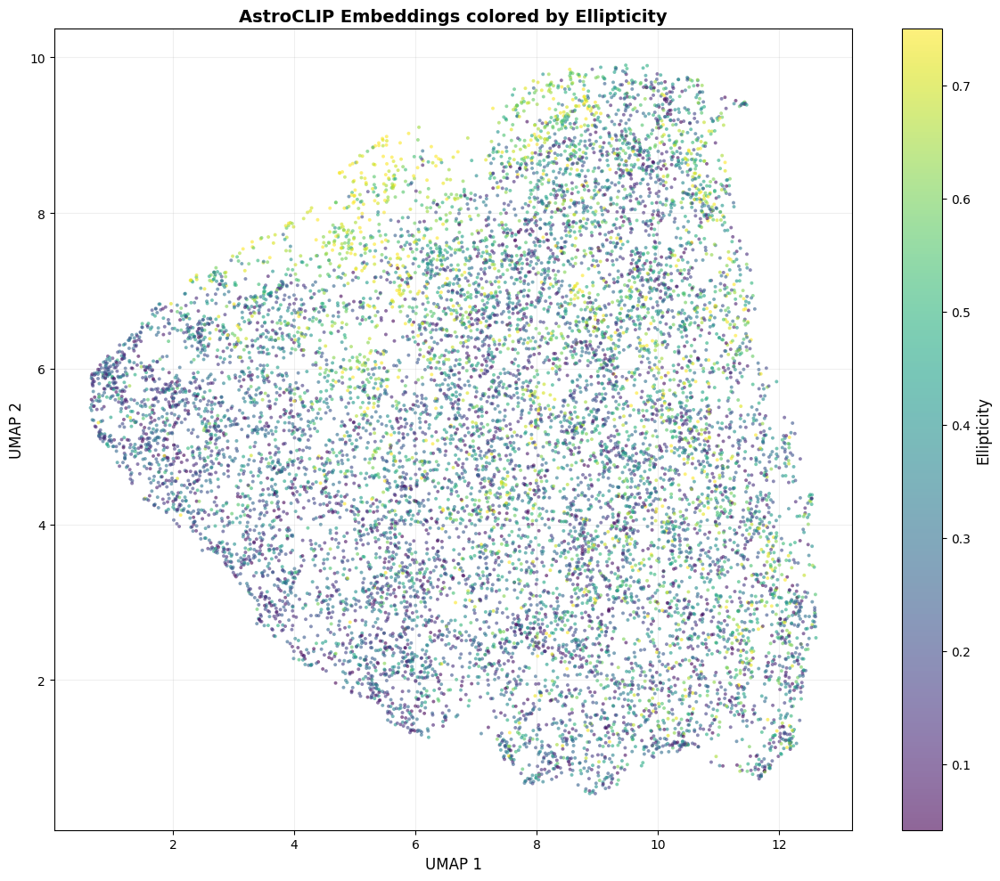

Saved: astroclip_embeddings_ellipticity.png


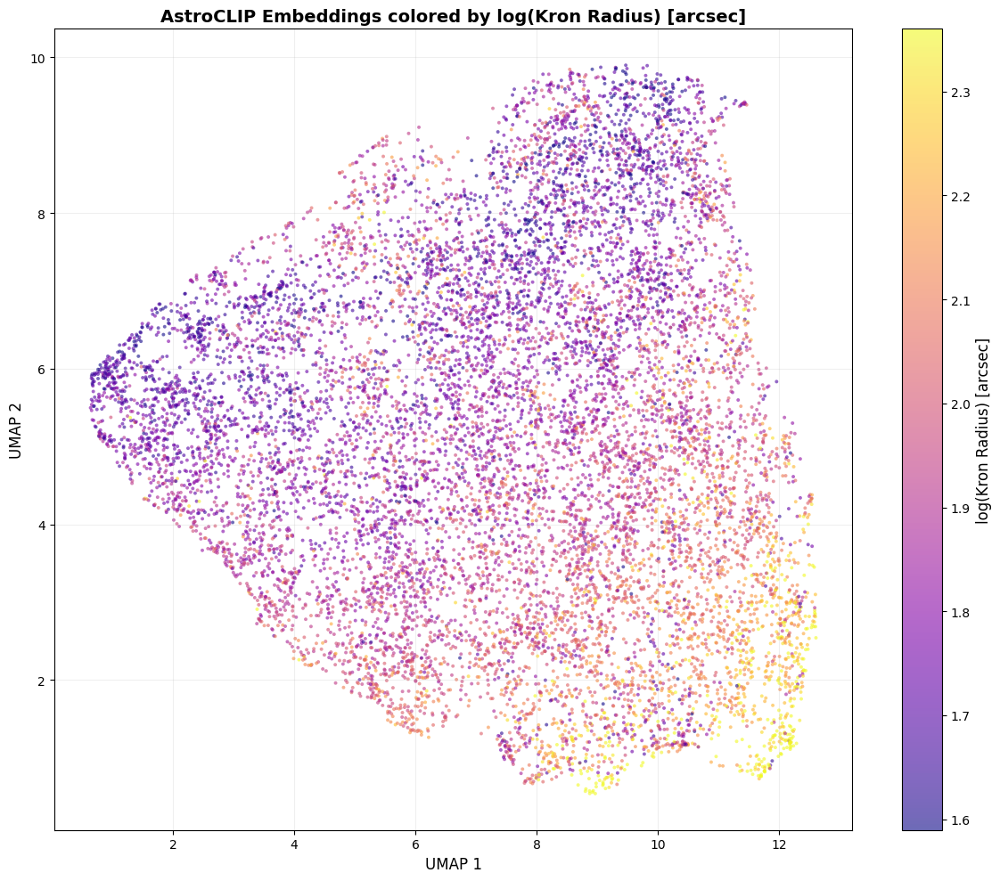

Saved: astroclip_embeddings_kron_radius.png


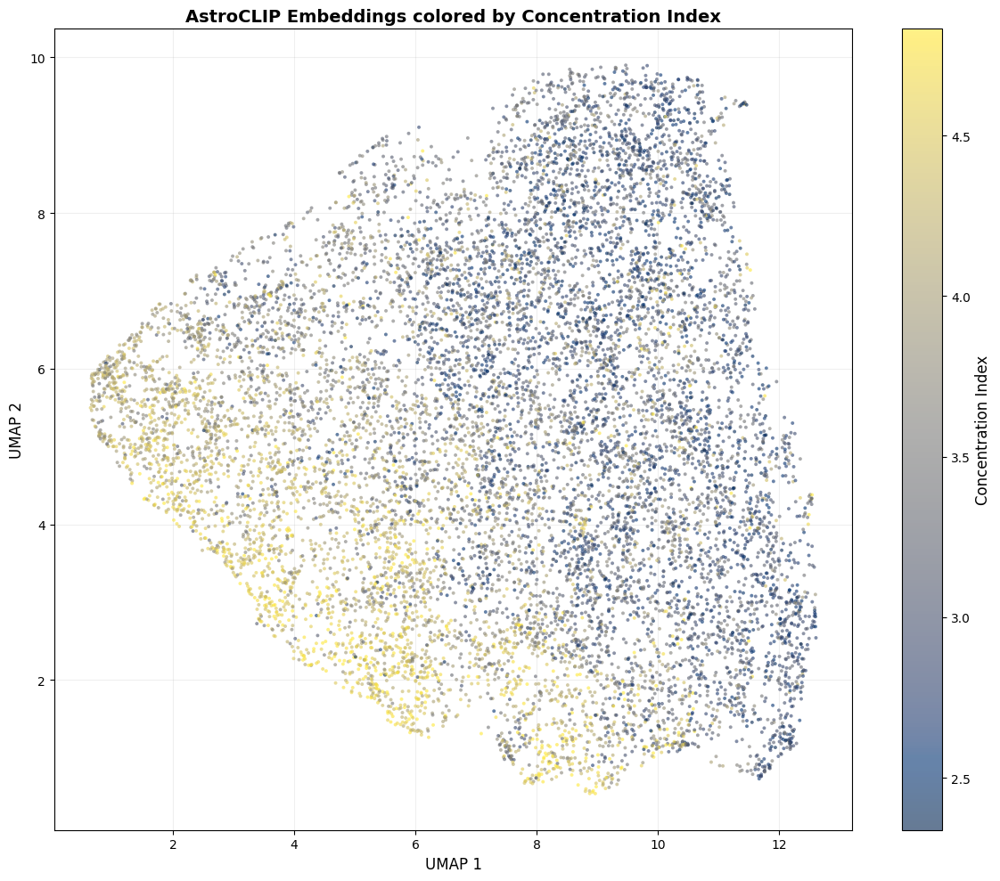

Saved: astroclip_embeddings_concentration.png


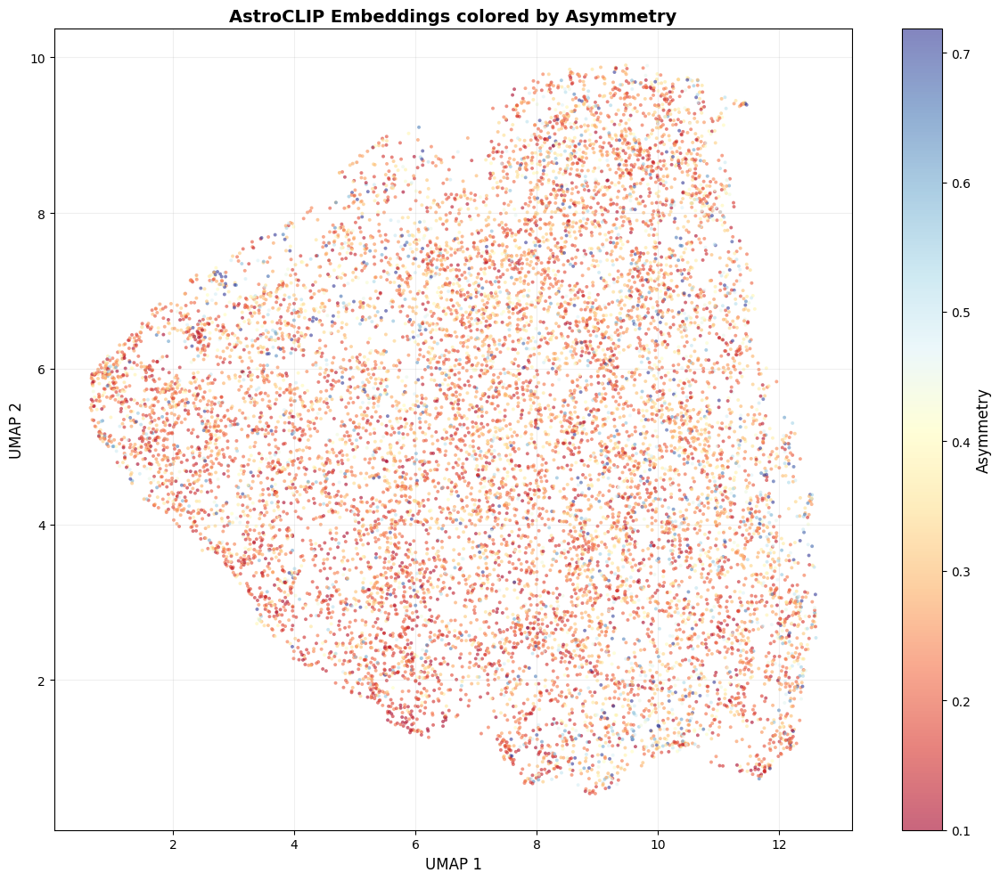

Saved: astroclip_embeddings_asymmetry.png


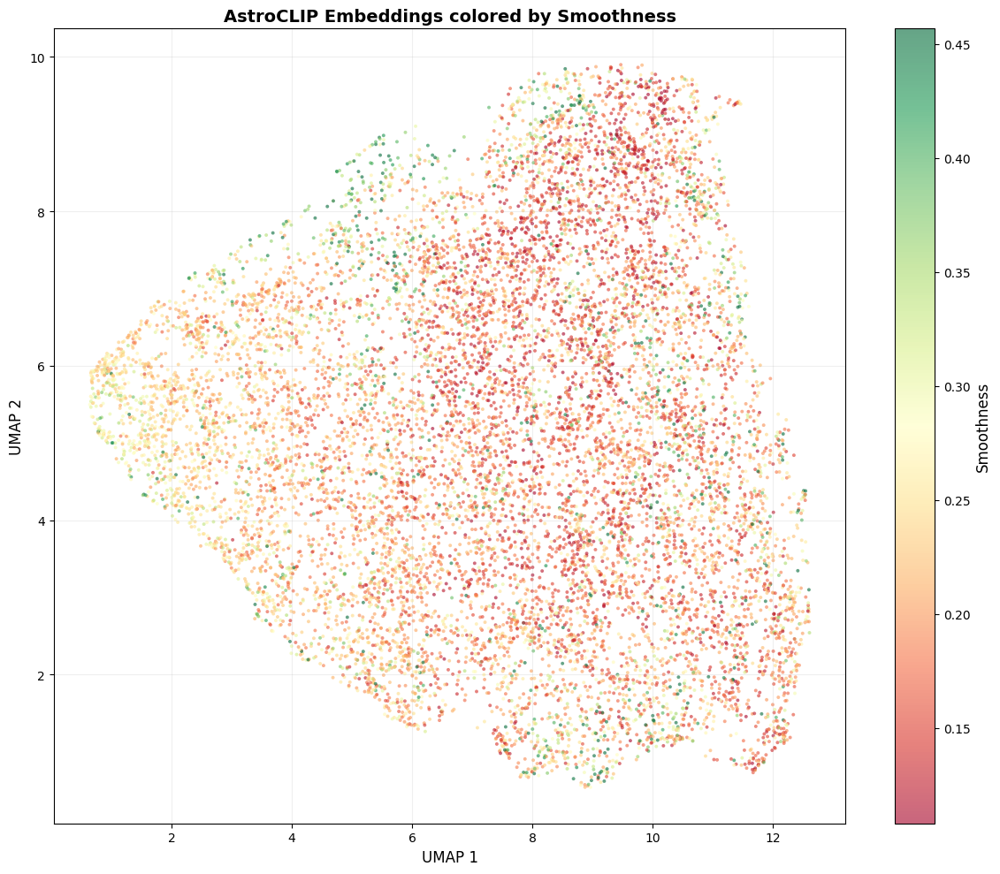

Saved: astroclip_embeddings_smoothness.png


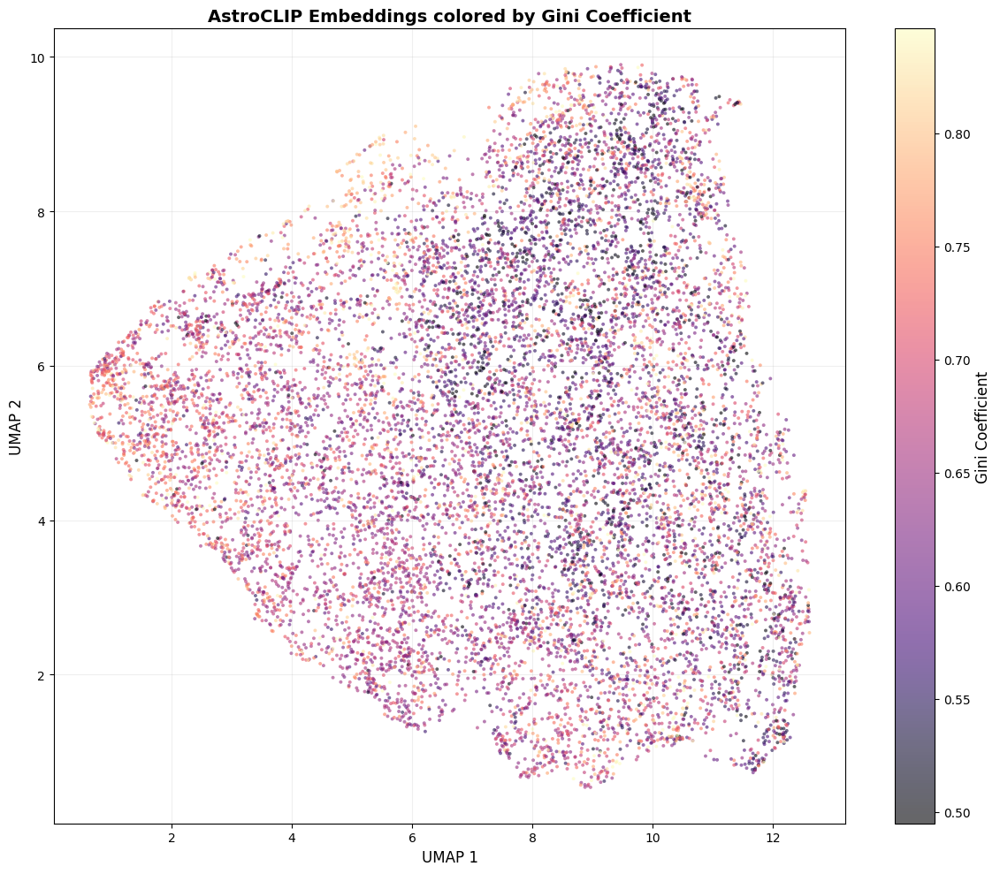

Saved: astroclip_embeddings_gini.png


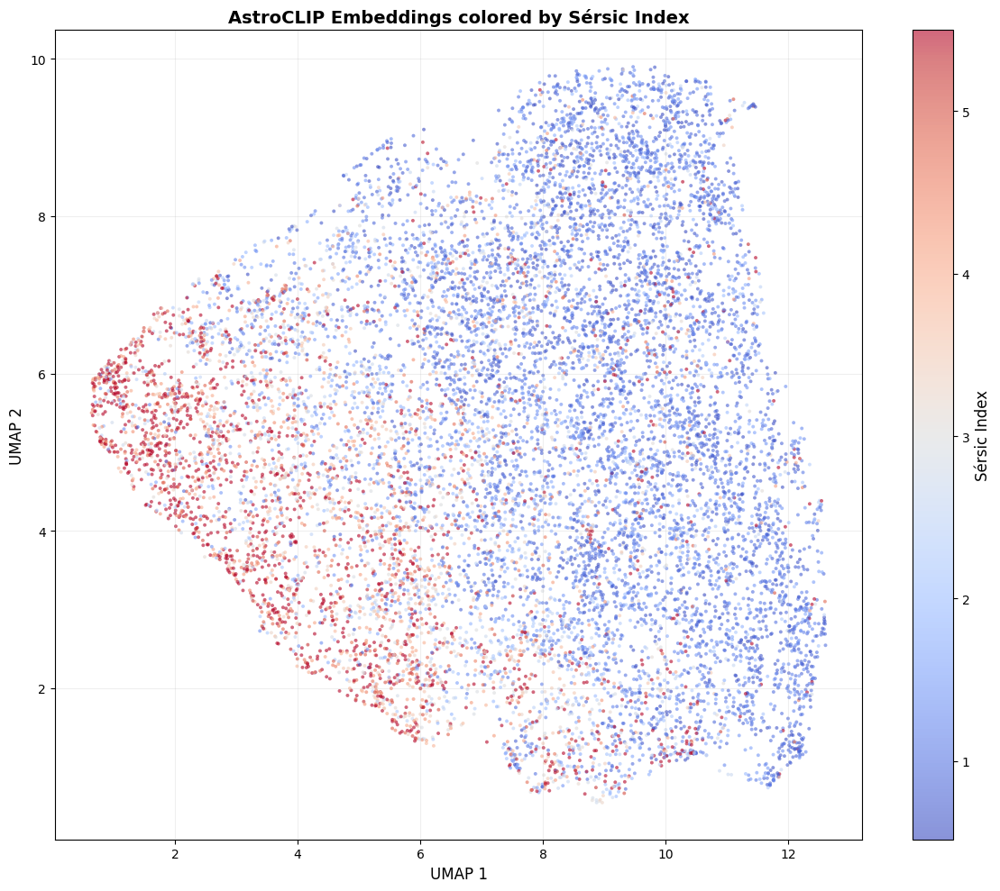

Saved: astroclip_embeddings_sersic_index.png


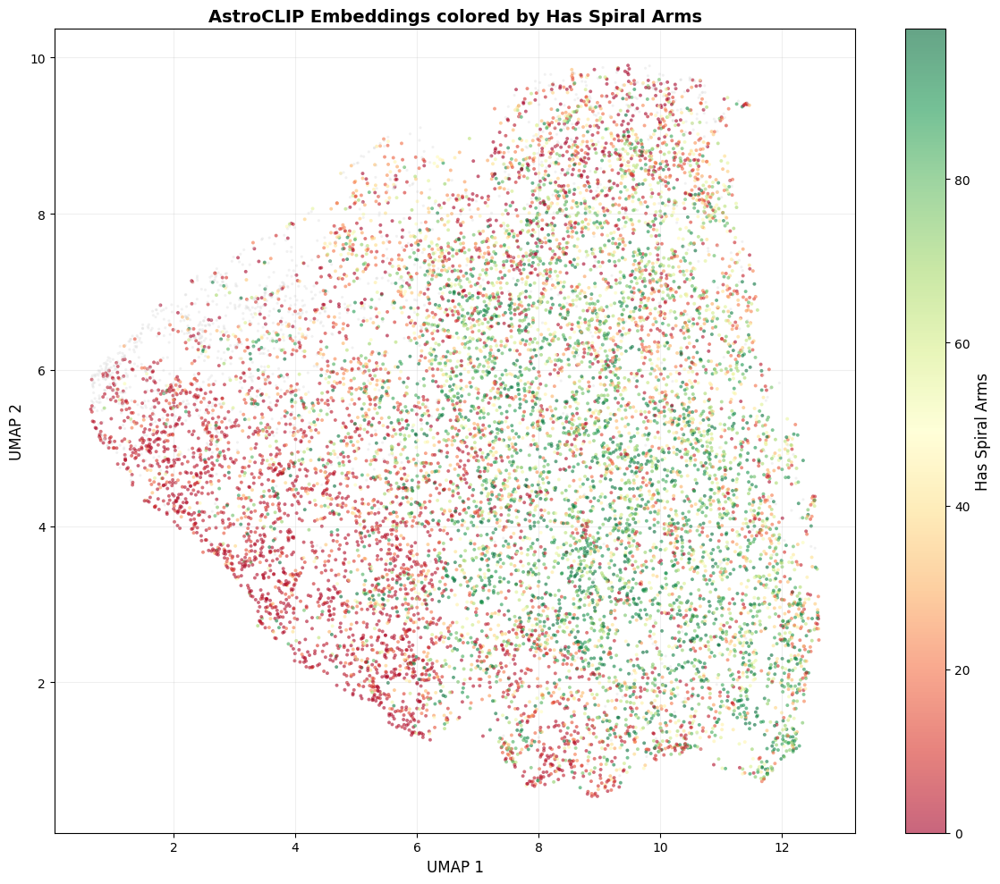

Saved: astroclip_embeddings_spiral_arms.png


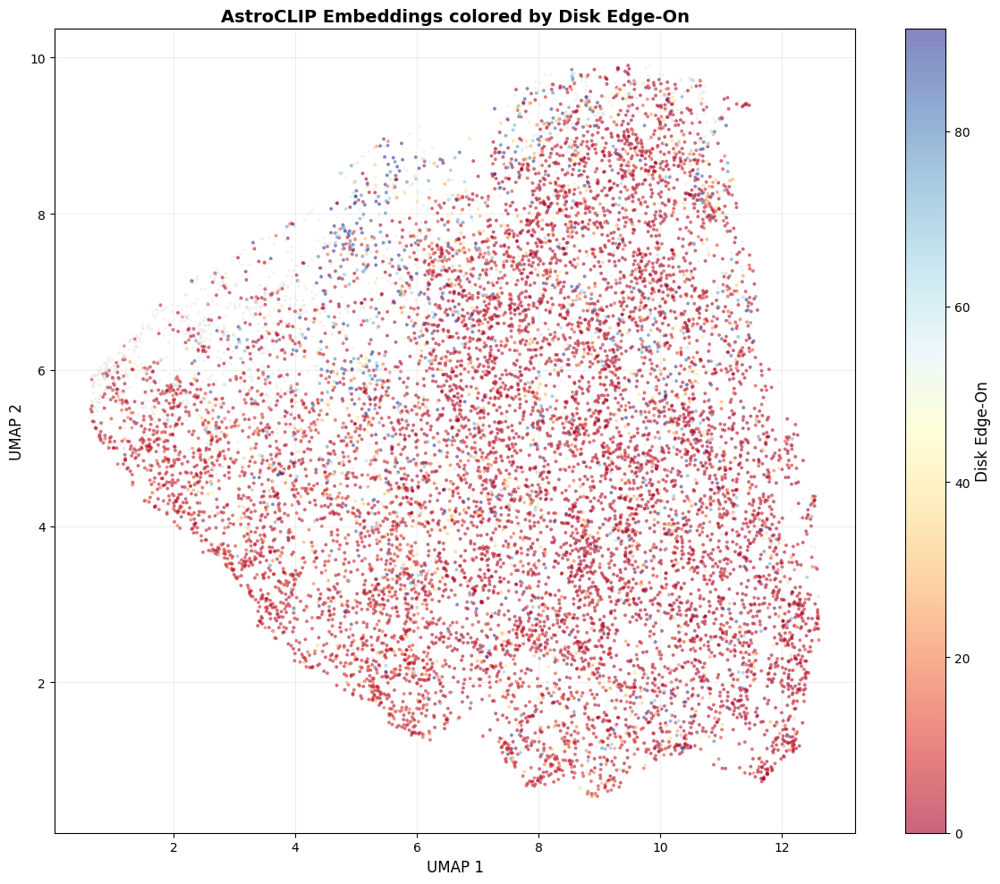

Saved: astroclip_embeddings_edge_on.png


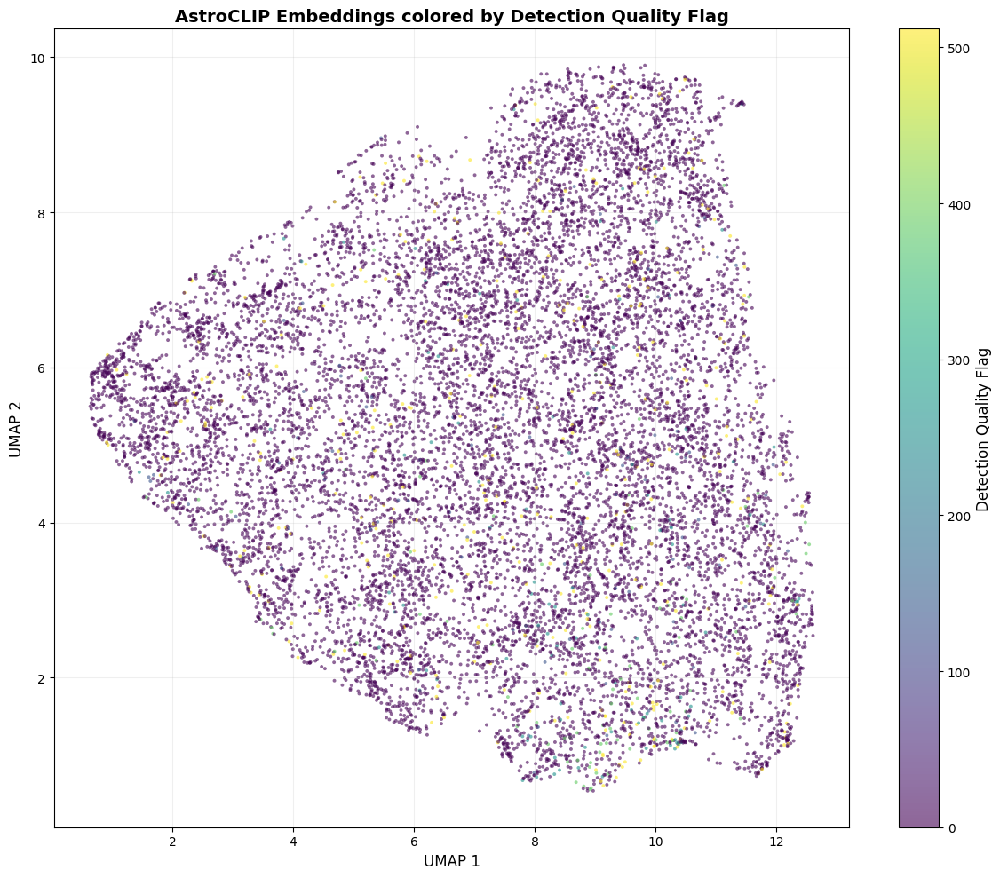

Saved: astroclip_embeddings_det_quality.png


In [9]:
def plot_property(property_data, property_name, cmap, output_file, vmin=None, vmax=None):
    """Create visualization for a given property."""
    fig, ax = plt.subplots(figsize=(12, 10))
    
    valid_mask = ~np.isnan(property_data)
    
    if valid_mask.sum() == 0:
        print(f"⚠ No valid data for {property_name}, skipping plot")
        plt.close(fig)
        return
    
    # Use provided vmin/vmax or calculate from data
    if vmin is None:
        vmin = np.nanpercentile(property_data, 2)
    if vmax is None:
        vmax = np.nanpercentile(property_data, 98)
    
    scatter = ax.scatter(
        embeddings_umap[valid_mask, 0],
        embeddings_umap[valid_mask, 1],
        c=property_data[valid_mask],
        cmap=cmap,
        s=8,
        alpha=0.6,
        edgecolors='none',
        vmin=vmin,
        vmax=vmax
    )
    
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label(property_name, fontsize=12)
    
    # Plot invalid in gray
    if (~valid_mask).sum() > 0:
        ax.scatter(
            embeddings_umap[~valid_mask, 0],
            embeddings_umap[~valid_mask, 1],
            s=5,
            color='lightgray',
            alpha=0.3,
            edgecolors='none'
        )
    
    ax.set_xlabel('UMAP 1', fontsize=12)
    ax.set_ylabel('UMAP 2', fontsize=12)
    ax.set_title(f'AstroCLIP Embeddings colored by {property_name}', fontsize=14, fontweight='bold')
    ax.grid(alpha=0.2)
    
    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Saved: {output_file}")

# Plot for different spectral/physical properties
print("\n" + "="*70)
print("SPECTRAL/PHYSICAL PROPERTIES VISUALIZATIONS")
print("="*70 + "\n")

spectral_property_configs = [
    (logm, 'log(M*/M☉) - Stellar Mass', 'plasma', 'astroclip_embeddings_logm.png', 8, 11),
    (logsfr, 'log(SFR) [M☉/yr] - Star Formation Rate', 'coolwarm', 'astroclip_embeddings_logsfr.png', -8, -2),
    (ssfr, 'log(sSFR) [yr⁻¹] - Specific SFR', 'coolwarm', 'astroclip_embeddings_ssfr.png', None, None),
    (dn4000, 'DN4000 (4000Å break)', 'RdYlBu_r', 'astroclip_embeddings_dn4000.png', None, None),
    (gr_color, 'g-r Color [mag]', 'RdBu_r', 'astroclip_embeddings_gr_color.png', None, None),
    (halpha_hbeta_ratio, 'Hα/Hβ Flux Ratio', 'viridis', 'astroclip_embeddings_halpha_hbeta_ratio.png', 2, 10),
    (snr_b, 'SNR in Blue Channel', 'magma', 'astroclip_embeddings_snr_b.png', None, None),
    (snr_r, 'SNR in Red Channel', 'magma', 'astroclip_embeddings_snr_r.png', None, None),
    (snr_z, 'SNR in Z Channel', 'magma', 'astroclip_embeddings_snr_z.png', None, None),
]

for prop_data, prop_name, cmap, output_file, vmin, vmax in spectral_property_configs:
    plot_property(prop_data, prop_name, cmap, output_file, vmin, vmax)

# Plot for morphological properties
print("\n" + "="*70)
print("MORPHOLOGICAL PROPERTIES VISUALIZATIONS")
print("="*70 + "\n")

morphological_property_configs = [
    (ellipticity, 'Ellipticity', 'viridis', 'astroclip_embeddings_ellipticity.png', None, None),
    (np.log10(kron_radius), 'log(Kron Radius) [arcsec]', 'plasma', 'astroclip_embeddings_kron_radius.png', None, None),
    (concentration, 'Concentration Index', 'cividis', 'astroclip_embeddings_concentration.png', None, None),
    (asymmetry, 'Asymmetry', 'RdYlBu', 'astroclip_embeddings_asymmetry.png', None, None),
    (smoothness, 'Smoothness', 'RdYlGn', 'astroclip_embeddings_smoothness.png', None, None),
    (gini, 'Gini Coefficient', 'magma', 'astroclip_embeddings_gini.png', None, None),
    (sersic_index, 'Sérsic Index', 'coolwarm', 'astroclip_embeddings_sersic_index.png', None, None),
    (has_spiral_arms, 'Has Spiral Arms', 'RdYlGn', 'astroclip_embeddings_spiral_arms.png', None, None),
    (disk_edge_on, 'Disk Edge-On', 'RdYlBu', 'astroclip_embeddings_edge_on.png', None, None),
    (det_quality_flag, 'Detection Quality Flag', 'viridis', 'astroclip_embeddings_det_quality.png', None, None),
]

for prop_data, prop_name, cmap, output_file, vmin, vmax in morphological_property_configs:
    plot_property(prop_data, prop_name, cmap, output_file, vmin, vmax)

## 8. Visualize by Spectral Type

Color embeddings by spectral classification (GALAXY, QSO, STAR).

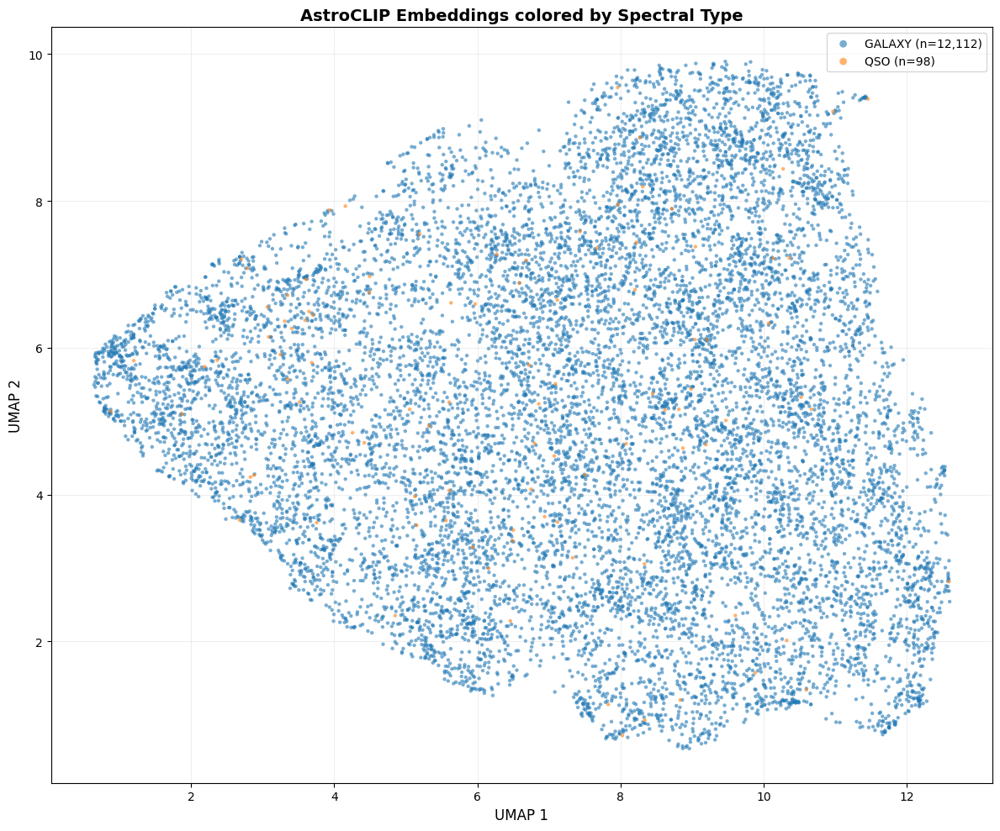

Saved: astroclip_embeddings_spectype.png


In [10]:
# Color palette for spectral types
colors_map = {
    'GALAXY': '#1f77b4',  # Blue
    'QSO': '#ff7f0e',     # Orange
    'STAR': '#2ca02c',    # Green
}

fig, ax = plt.subplots(figsize=(12, 10))

valid_mask = spectype != ''
unique_types = np.unique(spectype[valid_mask])

# Plot each spectral type
for stype in unique_types:
    mask = (spectype == stype)
    if mask.sum() > 0:
        color = colors_map.get(stype, '#d62728')
        ax.scatter(
            embeddings_umap[mask, 0],
            embeddings_umap[mask, 1],
            c=color,
            label=f'{stype} (n={mask.sum():,})',
            s=10,
            alpha=0.6,
            edgecolors='none'
        )

# Plot unknown
if (~valid_mask).sum() > 0:
    ax.scatter(
        embeddings_umap[~valid_mask, 0],
        embeddings_umap[~valid_mask, 1],
        c='lightgray',
        label=f'Unknown (n={(~valid_mask).sum():,})',
        s=6,
        alpha=0.3,
        edgecolors='none'
    )

ax.set_xlabel('UMAP 1', fontsize=12)
ax.set_ylabel('UMAP 2', fontsize=12)
ax.set_title('AstroCLIP Embeddings colored by Spectral Type', fontsize=14, fontweight='bold')
ax.legend(loc='best', fontsize=10, markerscale=2)
ax.grid(alpha=0.2)

plt.tight_layout()
plt.savefig('astroclip_embeddings_spectype.png', dpi=300, bbox_inches='tight')
plt.show()

print("Saved: astroclip_embeddings_spectype.png")

## 9. Correlation Analysis

Compute correlations between UMAP dimensions and physical properties.

In [11]:
print(f"\n{'='*70}")
print(f"CORRELATION ANALYSIS: AstroCLIP Embeddings")
print(f"{'='*70}")

properties_dict = {
    'Redshift': redshifts,
    'LOGM (Stellar Mass)': logm,
    'LOGSFR (SFR)': logsfr,
    'sSFR': ssfr,
    'DN4000 (Age)': dn4000,
    'g-r Color': gr_color,
    'Hα/Hβ ratio': halpha_hbeta_ratio,
    'SNR B-band': snr_b,
    'SNR R-band': snr_r,
    'SNR Z-band': snr_z,
    'Ellipticity': ellipticity,
    'log(Kron Radius)': np.log10(kron_radius),
    'Concentration': concentration,
    'Asymmetry': asymmetry,
    'Smoothness': smoothness,
    'Gini': gini,
    'Sérsic Index': sersic_index,
    'Has Spiral Arms': has_spiral_arms,
    'Disk Edge-On': disk_edge_on,
    'Det Quality Flag': det_quality_flag,
}

print(f"\n{'Property':<25} {'UMAP-1':>10} {'UMAP-2':>10} {'p-val 1':>10} {'p-val 2':>10}")
print("-" * 70)

for prop_name, prop_data in properties_dict.items():
    valid_mask = ~np.isnan(prop_data)
    if valid_mask.sum() > 100:
        corr1, pval1 = spearmanr(embeddings_umap[valid_mask, 0], prop_data[valid_mask])
        corr2, pval2 = spearmanr(embeddings_umap[valid_mask, 1], prop_data[valid_mask])
        sig1 = "***" if pval1 < 0.001 else "**" if pval1 < 0.01 else "*" if pval1 < 0.05 else ""
        sig2 = "***" if pval2 < 0.001 else "**" if pval2 < 0.01 else "*" if pval2 < 0.05 else ""
        print(f"{prop_name:<25} {corr1:>9.3f}{sig1} {corr2:>9.3f}{sig2} {pval1:>10.3e} {pval2:>10.3e}")
    else:
        print(f"{prop_name:<25} {'N/A':>10} {'N/A':>10} {'N/A':>10} {'N/A':>10}")

print("\n" + "="*70)
print("Significance: *** p<0.001, ** p<0.01, * p<0.05")
print("="*70)


CORRELATION ANALYSIS: AstroCLIP Embeddings

Property                      UMAP-1     UMAP-2    p-val 1    p-val 2
----------------------------------------------------------------------
Redshift                     -0.614***     0.070***  0.000e+00  6.784e-15
LOGM (Stellar Mass)          -0.494***    -0.179***  0.000e+00  7.518e-88
LOGSFR (SFR)                  0.258***     0.198*** 1.281e-183 6.955e-107
sSFR                          0.379***     0.227***  0.000e+00 8.894e-141
DN4000 (Age)                 -0.416***    -0.282***  0.000e+00 2.177e-222
g-r Color                    -0.596***    -0.189***  0.000e+00  3.347e-98
Hα/Hβ ratio                  -0.200***    -0.018  2.124e-71  1.200e-01
SNR B-band                    0.488***    -0.099***  0.000e+00  3.398e-28
SNR R-band                    0.110***    -0.310***  1.764e-34 1.703e-269
SNR Z-band                   -0.171***    -0.350***  9.311e-81  0.000e+00
Ellipticity                   0.092***     0.196***  2.011e-24 9.028e-106
log

## 10. Summary

Key findings from the AstroCLIP embeddings analysis.

In [12]:
print("="*70)
print("ASTROCLIP EMBEDDINGS ANALYSIS SUMMARY")
print("="*70)
print(f"\nTotal objects analyzed: {len(embeddings)}")
print(f"Embedding dimension: {embeddings.shape[1]}")

print(f"\nCatalog matching:")
if matched_indices is not None:
    print(f"  • Matched objects: {(matched_indices >= 0).sum()} ({match_rate:.1f}%)")
else:
    print(f"  • Matched objects: N/A")
print(f"  • Valid redshifts: {(~np.isnan(redshifts)).sum()}")
if (~np.isnan(redshifts)).sum() > 0:
    print(f"  • Redshift range: [{np.nanmin(redshifts):.3f}, {np.nanmax(redshifts):.3f}]")

print(f"\nEmbeddings source:")
print(f"  • /pbs/throng/training/astroinfo2025/data/AstroCLIP_team/AstroCLIP/")
print(f"    AstroCLIP_joint_embedding_outliers/embeddings_all.pt")

print("\n" + "="*70)
print("✓ Analysis complete! Figures saved to current directory.")
print("="*70)

print("\n📁 Generated files:")
print("  Spectral/Physical properties:")
print("    • astroclip_embeddings_redshift.png")
print("    • astroclip_embeddings_logm.png")
print("    • astroclip_embeddings_logsfr.png")
print("    • astroclip_embeddings_ssfr.png")
print("    • astroclip_embeddings_dn4000.png")
print("    • astroclip_embeddings_gr_color.png")
print("    • astroclip_embeddings_halpha_hbeta_ratio.png")
print("    • astroclip_embeddings_snr_b.png")
print("    • astroclip_embeddings_snr_r.png")
print("    • astroclip_embeddings_snr_z.png")
print("    • astroclip_embeddings_spectype.png")
print("  Morphological properties:")
print("    • astroclip_embeddings_ellipticity.png")
print("    • astroclip_embeddings_kron_radius.png")
print("    • astroclip_embeddings_concentration.png")
print("    • astroclip_embeddings_asymmetry.png")
print("    • astroclip_embeddings_smoothness.png")
print("    • astroclip_embeddings_gini.png")
print("    • astroclip_embeddings_sersic_index.png")
print("    • astroclip_embeddings_spiral_arms.png")
print("    • astroclip_embeddings_edge_on.png")
print("    • astroclip_embeddings_det_quality.png")

ASTROCLIP EMBEDDINGS ANALYSIS SUMMARY

Total objects analyzed: 12210
Embedding dimension: 1024

Catalog matching:
  • Matched objects: 12210 (100.0%)
  • Valid redshifts: 12210
  • Redshift range: [0.009, 1.797]

Embeddings source:
  • /pbs/throng/training/astroinfo2025/data/AstroCLIP_team/AstroCLIP/
    AstroCLIP_joint_embedding_outliers/embeddings_all.pt

✓ Analysis complete! Figures saved to current directory.

📁 Generated files:
  Spectral/Physical properties:
    • astroclip_embeddings_redshift.png
    • astroclip_embeddings_logm.png
    • astroclip_embeddings_logsfr.png
    • astroclip_embeddings_ssfr.png
    • astroclip_embeddings_dn4000.png
    • astroclip_embeddings_gr_color.png
    • astroclip_embeddings_halpha_hbeta_ratio.png
    • astroclip_embeddings_snr_b.png
    • astroclip_embeddings_snr_r.png
    • astroclip_embeddings_snr_z.png
    • astroclip_embeddings_spectype.png
  Morphological properties:
    • astroclip_embeddings_ellipticity.png
    • astroclip_embeddings_kron